<a href="https://colab.research.google.com/github/MuBuBaamm/EfficientNet/blob/main/efficientnet_parasite.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install tensorflow

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
from google.colab import drive

drive.mount ('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
cd '/content/drive/MyDrive/dataset_parasite'

/content/drive/MyDrive/dataset_parasite


In [ ]:
ls

 Artifact/               'Enterobius vermicularis'/  'Opisthorchis viverini'/
'Ascaris lumbricoides'/   Hookworms/                 'Taenia spp'/
'Echinostoma spp'/       'Minute Intestinal Fluke'/  'Trichuris trichiura'/


In [ ]:
import pathlib

dataset_parasite = ('/content/drive/MyDrive/dataset_parasite')
data_dir = pathlib.Path(dataset_parasite)

In [ ]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

453


In [ ]:
batch_size = 64
img_height = 224
img_width = 224

In [ ]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_parasite,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_height,img_width),
    batch_size=batch_size
)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_parasite,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 453 files belonging to 9 classes.
Using 363 files for training.
Found 453 files belonging to 9 classes.
Using 90 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['Artifact', 'Ascaris lumbricoides', 'Echinostoma spp', 'Enterobius vermicularis', 'Hookworms', 'Minute Intestinal Fluke', 'Opisthorchis viverini', 'Taenia spp', 'Trichuris trichiura']


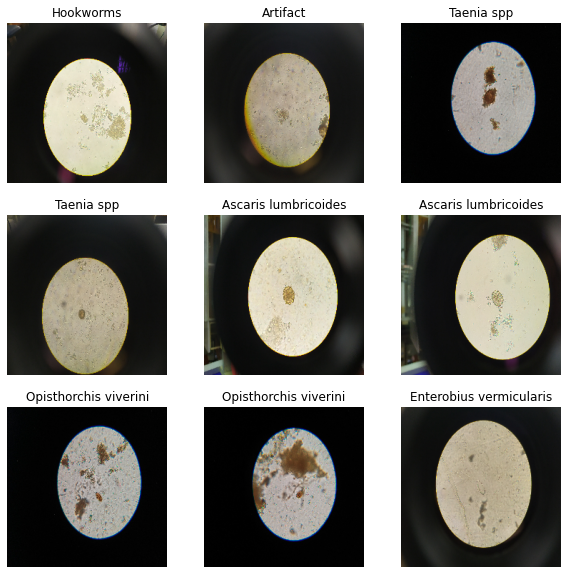

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [ ]:
from tensorflow.keras.models import Sequential

data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip(),
        layers.experimental.preprocessing.RandomRotation(0.15),
        layers.experimental.preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.1),
        layers.experimental.preprocessing.RandomContrast(factor=0.1)
    ]
)

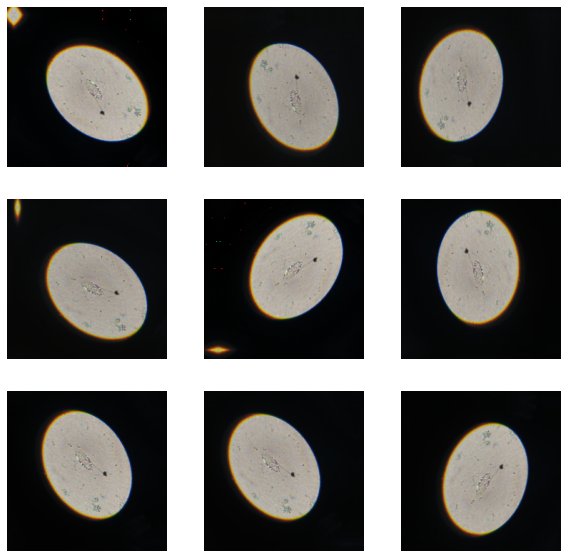

In [ ]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

In [ ]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
    print("Running on TPU ", tpu.cluster_spec().as_dict()["worker"])
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except ValueError:
    print("Not connected to a TPU runtime. Using CPU/GPU strategy")
    strategy = tf.distribute.MirroredStrategy()

Not connected to a TPU runtime. Using CPU/GPU strategy
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
NUM_CLASSES = len(list(class_names))
print(NUM_CLASSES)

9


In [ ]:
def input_preprocess(images, labels):
    labels = tf.one_hot(labels, NUM_CLASSES)
    return images, labels

    augmented_train_ds = train_ds.map(input_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    
    train_ds = train_ds.batch(batch_size=batch_size, drop_remainder=True)
    train_ds = train_ds.prefetch(tf.data.experimental.AUTOTUNE)

    val_ds = val_ds.map(input_preprocess)
    val_ds = val_ds.batch(batch_size=batch_size, drop_remainder=True)
    val_ds = train_ds.prefetch(tf.data.experimental.AUTOTUNE)

In [ ]:
from tensorflow.keras.applications import EfficientNetB0

with strategy.scope():
    inputs = layers.Input(shape=(img_height,img_width, 3))
    x = data_augmentation(inputs)
    outputs = EfficientNetB0(include_top=True, weights=None, classes=NUM_CLASSES)(x)

    model = tf.keras.Model(inputs, outputs)
    model.compile(
        optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )

model.summary()

epochs = 40  # @param {type: "slider", min:10, max:100}
hist = model.fit(train_ds, epochs=epochs, validation_data=val_ds, verbose=2)

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Redu

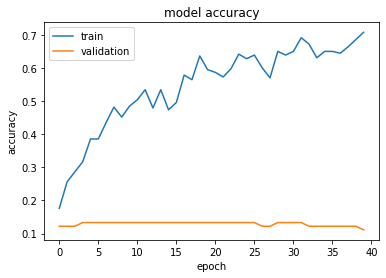

In [ ]:
import matplotlib.pyplot as plt


def plot_hist(hist):
    plt.plot(hist.history["accuracy"])
    plt.plot(hist.history["val_accuracy"])
    plt.title("model accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()


plot_hist(hist)

In [ ]:
from tensorflow.keras.layers.experimental import preprocessing


def build_model(num_classes):
    inputs = layers.Input(shape=(img_height,img_width, 3))
    x = data_augmentation(inputs)
    model = EfficientNetB0(include_top=False, input_tensor=x, weights="imagenet")

    # Freeze the pretrained weights
    model.trainable = False

    # Rebuild top
    x = layers.GlobalAveragePooling2D(name="avg_pool")(model.output)
    x = layers.BatchNormalization()(x)

    top_dropout_rate = 0.2
    x = layers.Dropout(top_dropout_rate, name="top_dropout")(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax", name="pred")(x)

    # Compile
    model = tf.keras.Model(inputs, outputs, name="EfficientNet")
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-2)
    model.compile(
        optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )
    return model

Epoch 1/25
6/6 - 68s - loss: 1.9836 - accuracy: 0.5096 - val_loss: 1.8176 - val_accuracy: 0.3556
Epoch 2/25
6/6 - 58s - loss: 1.1275 - accuracy: 0.7025 - val_loss: 2.1697 - val_accuracy: 0.2889
Epoch 3/25
6/6 - 58s - loss: 1.0187 - accuracy: 0.7273 - val_loss: 2.3248 - val_accuracy: 0.3222
Epoch 4/25
6/6 - 58s - loss: 0.8173 - accuracy: 0.7769 - val_loss: 2.0336 - val_accuracy: 0.4000
Epoch 5/25
6/6 - 58s - loss: 0.8343 - accuracy: 0.7713 - val_loss: 1.7845 - val_accuracy: 0.4556
Epoch 6/25
6/6 - 57s - loss: 0.7160 - accuracy: 0.8292 - val_loss: 1.8105 - val_accuracy: 0.4556
Epoch 7/25
6/6 - 57s - loss: 0.5149 - accuracy: 0.8540 - val_loss: 1.6927 - val_accuracy: 0.4667
Epoch 8/25
6/6 - 57s - loss: 0.6941 - accuracy: 0.7934 - val_loss: 1.3506 - val_accuracy: 0.5556
Epoch 9/25
6/6 - 57s - loss: 0.6424 - accuracy: 0.8237 - val_loss: 1.4335 - val_accuracy: 0.5667
Epoch 10/25
6/6 - 57s - loss: 0.4215 - accuracy: 0.8733 - val_loss: 1.3863 - val_accuracy: 0.5556
Epoch 11/25
6/6 - 58s - loss:

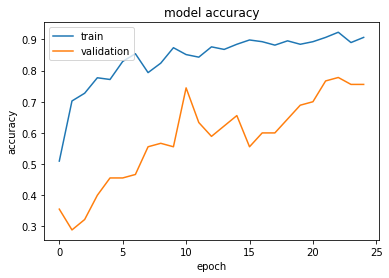

In [ ]:
with strategy.scope():
    model = build_model(num_classes=NUM_CLASSES)

epochs = 25  # @param {type: "slider", min:8, max:80}
hist = model.fit(train_ds, epochs=epochs, validation_data=val_ds, verbose=2)
plot_hist(hist)

Epoch 1/10
6/6 - 67s - loss: 0.3182 - accuracy: 0.9146 - val_loss: 0.7585 - val_accuracy: 0.7556
Epoch 2/10
6/6 - 57s - loss: 0.1876 - accuracy: 0.9477 - val_loss: 0.7385 - val_accuracy: 0.7778
Epoch 3/10
6/6 - 57s - loss: 0.1668 - accuracy: 0.9366 - val_loss: 0.7129 - val_accuracy: 0.7667
Epoch 4/10
6/6 - 57s - loss: 0.2323 - accuracy: 0.9284 - val_loss: 0.7316 - val_accuracy: 0.7889
Epoch 5/10
6/6 - 57s - loss: 0.1520 - accuracy: 0.9394 - val_loss: 0.7324 - val_accuracy: 0.7889
Epoch 6/10
6/6 - 58s - loss: 0.2544 - accuracy: 0.9311 - val_loss: 0.7280 - val_accuracy: 0.7778
Epoch 7/10
6/6 - 58s - loss: 0.3196 - accuracy: 0.9036 - val_loss: 0.7110 - val_accuracy: 0.7889
Epoch 8/10
6/6 - 58s - loss: 0.2483 - accuracy: 0.9256 - val_loss: 0.6694 - val_accuracy: 0.7889
Epoch 9/10
6/6 - 57s - loss: 0.2049 - accuracy: 0.9339 - val_loss: 0.6239 - val_accuracy: 0.8000
Epoch 10/10
6/6 - 57s - loss: 0.1166 - accuracy: 0.9559 - val_loss: 0.5976 - val_accuracy: 0.8333


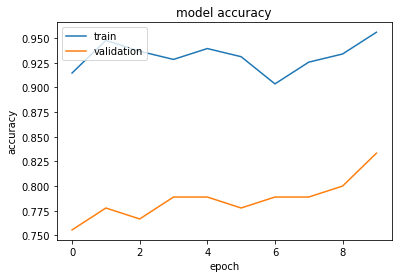

In [ ]:
def unfreeze_model(model):
    # We unfreeze the top 20 layers while leaving BatchNorm layers frozen
    for layer in model.layers[-20:]:
        if not isinstance(layer, layers.BatchNormalization):
            layer.trainable = True

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
    model.compile(
        optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )


unfreeze_model(model)

epochs = 10  # @param {type: "slider", min:8, max:50}
hist = model.fit(train_ds, epochs=epochs, validation_data=val_ds, verbose=2)
plot_hist(hist)

# SAVE MODEL

In [ ]:
model_json = model.to_json()
with open("model.json", "w") as json_file :
 json_file.write(model_json)

model.save_weights("model.h5")
print("Saved model to disk")

model.save('efficientnet.model')

Saved model to disk
INFO:tensorflow:Assets written to: efficientnet.model/assets


# TEST MODEL

In [ ]:
from keras.models import load_model

model_path = '/content/drive/MyDrive/dataset_parasite/efficientnet.model'
model = tf.keras.models.load_model(model_path, compile=True)

In [ ]:
import numpy as np
from IPython.display import Image

def model_predict(path):
    img = keras.preprocessing.image.load_img(path, target_size=(224, 224))
    img_array = keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array)
    score = tf.nn.softmax(predictions[0])
    display(Image(filename=path))
    print("{} {:.2f} %".format(class_names[np.argmax(score)], 100 * np.max(score)))

In [ ]:
img = keras.preprocessing.image.load_img('/content/drive/MyDrive/Enterobius.JPG', target_size=(224, 224))
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)
predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])
print(score)

tf.Tensor(
[0.09761278 0.13619891 0.09917507 0.09778775 0.10109509 0.09767904
 0.09858    0.16849196 0.10337937], shape=(9,), dtype=float32)


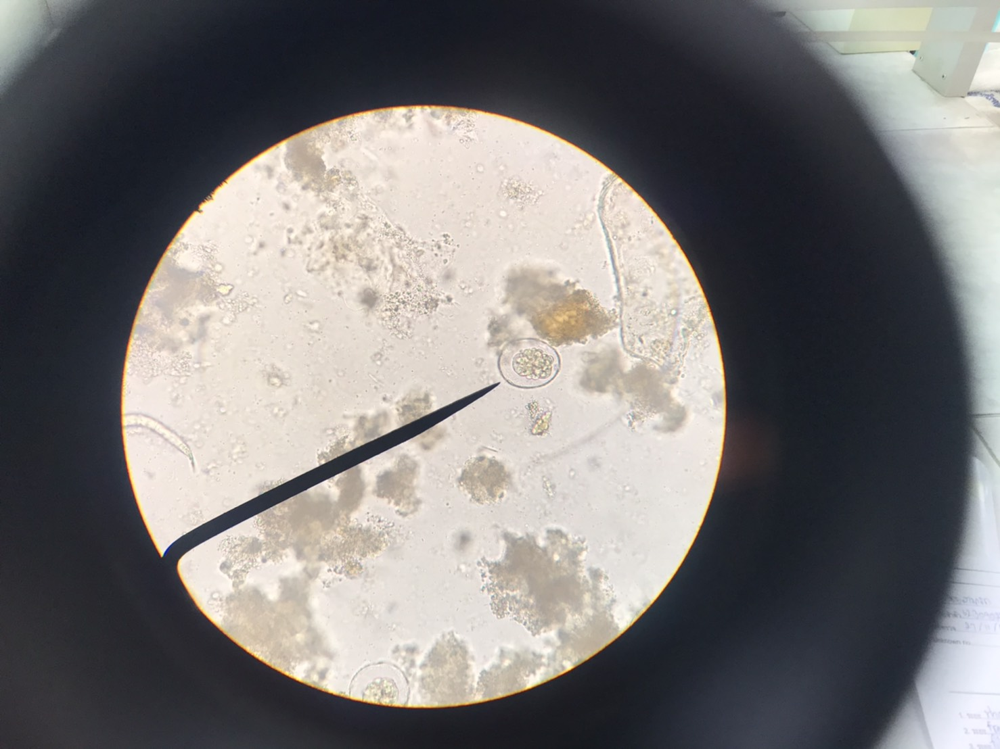

Taenia spp 16.85 %


In [ ]:
model_predict('/content/drive/MyDrive/Enterobius.JPG')

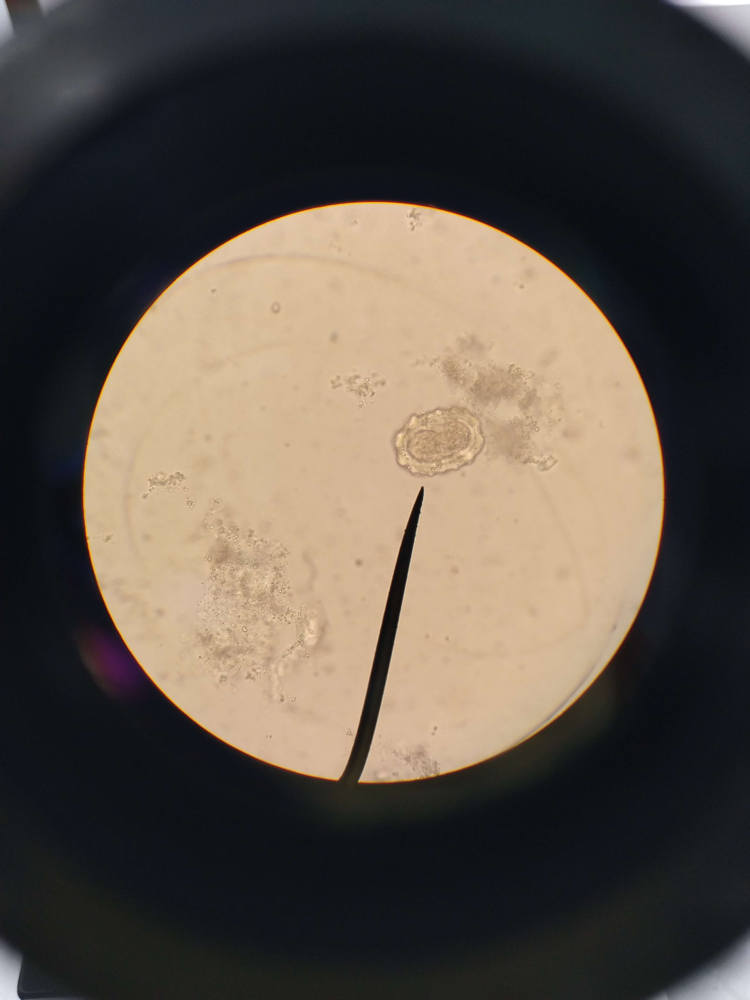

Trichuris trichiura 18.54 %


In [ ]:
model_predict('/content/drive/MyDrive/Ascaris.jpg')

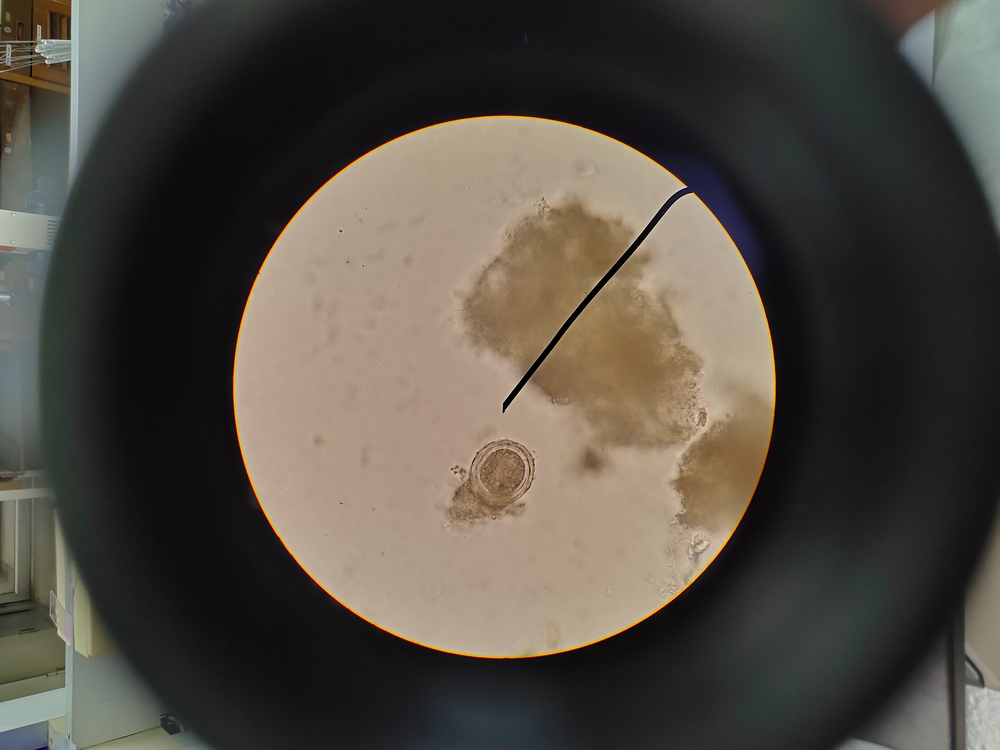

Trichuris trichiura 25.27 %


In [ ]:
model_predict('/content/drive/MyDrive/Taenia.jpg')

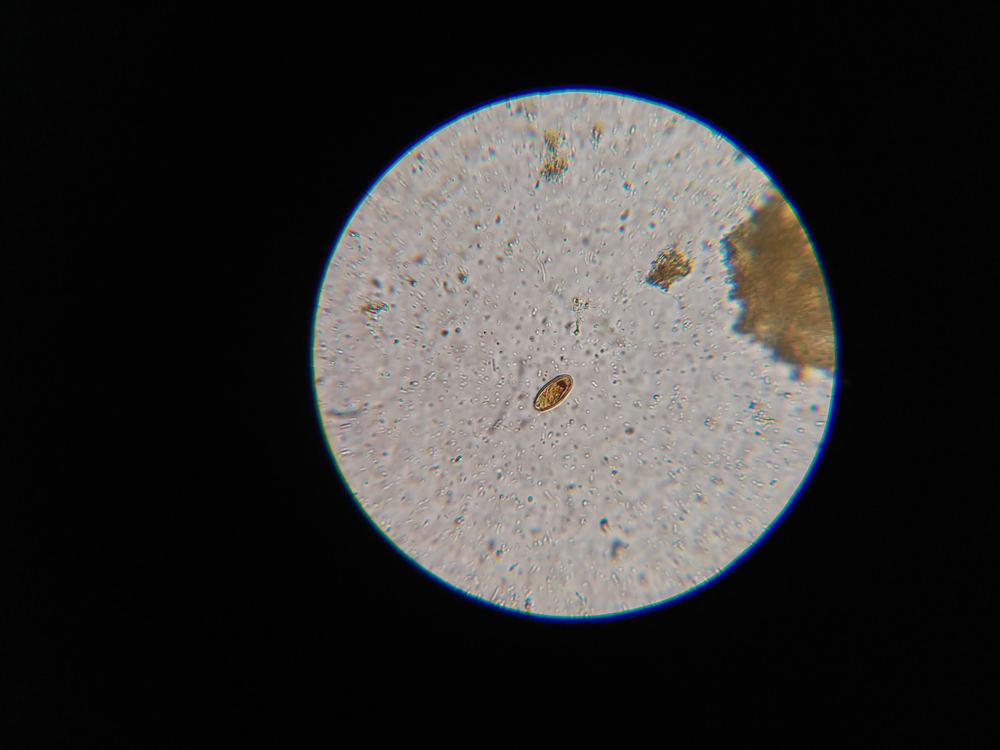

Taenia spp 22.24 %


In [ ]:
model_predict('/content/drive/MyDrive/dataset_parasite/Minute Intestinal Fluke/IMG_20190722_121600.jpg')